<H1>Libraries and Settings</H1>

In [15]:
import time
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from bokeh.plotting import figure, show, output_file 
from bokeh.models.tools import HoverTool, Range1d
from bokeh.io import output_notebook
import pandas_bokeh

pandas_bokeh.output_notebook()
pd.set_option('display.max_rows', 500)

Loading BokehJS ...

<H1>Workflow overview</H1>

<ol>
    <li>Rawfile conversion to .mgf with Raw Converter</li>
        <ol>
            <li>Monoisotopic precursor selection</li>
            <li>Before running spectrum cluster, gather .mgf files, add "SCANNUM=" line to identify individual spectra, concatenate fragmentation spectra (done in this notebook)</li>
        </ol>
    <li>MS2 Clustering with Spectrum Cluster</li>
        <ol>
            <li>settings: java -jar .\spectra-cluster-cli-1.1.2.jar -rounds 4 -threshold_end 0.999 -threshold_start 1 -output_path "___" \reformatted_rawfiles1.mgf -precursor_tolerance 1000 -fragment_tolerance 0.01 -filter mz_150 -add_scores</li>
            <li>processing for 15x1h Q-exactive DDA runs takes ~12h</li>
        </ol>
    <li>Classic Proteomics Database Search with Metamorpheus</li>
        <ol>
            <li>Human proteome obtained from uniprot</li>
            <li>initial GPTMD search: 10ppm precursor, 20ppm fragment, default settings except added glycosylation and trypsin cleavage as additional mods</li>
            <li>search with GPTMD DB: 10ppm precursor, 20ppm fragment, default settings</li>
            <li>put metamorpheus output folder in 'proteomics_searches' directory; "AllPSMs.psmtsv" is the necessary output file for this workbook</li>
        </ol>
    <li>Data Processing with this Notebook</li>
        <ol>
            <li>Integrate spectrum cluster and metamorpheus data</li>
            <li>Calculate delta masses globally and within experimental groups</li>
            <li>Plot</li>
        </ol>
</ol>

<ol>
    <li>Required software</li>
        <ol>
            <li>Mass spectrometry data converter: RawConverter 1.1.0.23 (fields.scripps.edu/rawconv/)</li>
            <li>Mass spectrometry classic database search: Metamorpheus 0.0.320 (github.com/smith-chem-wisc/MetaMorpheus/)</li>
            <li>Clustering: spectra-cluster-cli 1.1.2 (github.com/spectra-cluster/spectra-cluster-cli)</li>
        </ol>
    <li>Required libraries</li>
        <ol>
            <li>Python: 3.8.16</li>
            <li>pandas 1.4.2</li>
            <li>matplotlib 3.5.1</li>
            <li>numpy 1.22.3</li>
            <li>bokeh 2.4.3 (versions >3 currently not compatible)</li>
            <li>pandas_bokeh 0.5</li>
        </ol>
</ol>

Datatype considerations: Note that this workflow is meant to be applied to LC-MS/MS proteomics data collected in a data-dependent acquisition format on high-resolution accurate mass instruments. For precision in unknown PTM identification where control unmodified and modified peptides are compared, high-resolution MS1 data enable accurate delta mass calculations between similar peptides. High-resolution MS2 are not critical but could assist downstream or in cases where multiple modifications exist on a single peptide/precursor.

<H1>Global Variables</H1>

In [33]:
start = time.time()

#------------
#------PART 1
#------------

#---list of .mgf files created by RawConverter (monoisotopic peak peaking enabled)
mgf_file_list1 = ['rawfiles/h-6.mgf', 'rawfiles/h-7.mgf', 'rawfiles/h-8.mgf', 'rawfiles/h-9.mgf', 'rawfiles/h-10.mgf',
                 'rawfiles/n-1.mgf', 'rawfiles/n-2.mgf', 'rawfiles/n-3.mgf', 'rawfiles/n-4.mgf', 'rawfiles/n-5.mgf',
                 'rawfiles/p-1.mgf', 'rawfiles/p-2.mgf', 'rawfiles/p-3.mgf', 'rawfiles/p-4.mgf', 'rawfiles/p-5.mgf']

#---name of file containing concatenated .mgf data from list above
reformatted_mgf_file_name = 'rawfiles/reformatted_rawfiles1.mgf'

#---path to spectra cluster output file
cluster_file_name = 'spectrum_cluster/spectrum_cluster_out7'

#---path to metamorpheus allpsms file
metamorpheus_psm_file_name = 'proteomics_searches/2022-11-17-16-54-07/Task1-SearchTask/AllPSMs.psmtsv'

#---q-value cut-off for metamorpheus DDA matching hits
metamorpheus_qval_cutoff = 0.01

#---name of output csv file containing spectrum cluster and morpheus data
name_of_output_table = 'spectrum_cluster/spectrumcluster_peptide_table7.csv'


#------------
#------PART 2
#------------

#---path to integrated file containing data from spectrum cluster and metamorpheus (csv)
clustering_psm_file = name_of_output_table
#clustering_psm_file = 'spectrum_cluster/spectrumcluster_peptide_table7.csv'

#---set lower limit for delta masses to be included in histograms
#---this variable is meant to reduce noise from comparison of identical precursors
delta_mass_lower_limit = 0.5

#---set x-value range for Bokeh plots
x_val_range_bokeh = (-50,1050)

#---round delta masses to this many digits
rounded_digits_after_zero = 3

#---define experimental groups and their prefix labels
exp_group_dict1 = {'healthy': 'h', 'disease': 'p', 'asymptomatic': 'n'}


end = time.time()
print(end-start)

0.0005648136138916016


<H1><u>Run Once</u>: Raw data prep for spectrum cluster</H1>
<H3>Input: monoisotopic peak picked data using RawConverter (.mgf file)</H3>
<H3>Output: single .mgf file (named according to 'reformatted_mgf_file_name' global variable) containing all spectra</H3>

In [ ]:
start = time.time()

#---Reformat .mgf file to include scan number in TITLE line (otherwise there is no scan number for later correlation)
#---Read then write out new .mgf file with scan number appended to title line "SCANNUM="

def reformatAndCombineMGF(outputfilename1, mgflist1):
    #---input: name of output file (outputfilename1), list of paths/names to .mgf files (mgflist1)
    #---output: single .mgf file containing all 
    temp_title = ''
    with open(outputfilename1, 'w') as i:
        for item1 in mgflist1:
            #---open .mgf file
            with open(item1, 'r') as h:
                file1 = h.readlines()
            #---read through file, then write, scan number should be appended to title line "SCANNUM="
            for line1 in file1:
                if ('TITLE=' not in line1) and ('SCANS=' not in line1):
                    i.write(line1)
                elif 'TITLE=' in line1:
                    temp_title = line1.replace('\n', '')
                elif 'SCANS=' in line1:
                    line2 = line1.split('=')[1].replace('\n', '')
                    line3 = temp_title + '_SCANNUM=' + str(line2) + '\n'
                    i.write(line3)
                    i.write(line1)
                    temp_title = ''

#---run function above
reformatAndCombineMGF(reformatted_mgf_file_name, mgf_file_list1)

end = time.time()
print(end-start)

<H1>Functions</H1>

In [22]:
start = time.time()

#------------
#------PART 1
#------------

def p1a_conditionClusterFile(clusterfileinput1):
    #---Input: spectra cluster output file (clusterfileinput1)
    #---Output: dataframe containing 8 columns ('cluster_number', 'consensus_precursor', 'consensus_mz_list', 'consensus_intensity_list', 'consensus_peak_count_list', 'cluster_member_count', 'spectrum_list_scan_mz_charge_score', 'precursor_masses')
    
    #---read in cluster file
    with open(clusterfileinput1, 'r') as f:
        file1 = f.readlines()

    #---temporary variables for iterating through cluster file
    cluster_counter = -1
    cluster_count_list = []
    consensus_precursor_list = []
    consensus_mz_list = []
    consensus_intensity_list = []
    consensus_peak_count_list = []
    cluster_member_count_list = []
    cluster_member_counter = 0
    mini_spectrum_list = []
    spectrum_list = []

    #---iterate through cluster file and fill in variables
    for row1 in file1:
        if "=Cluster=" in row1:
            cluster_counter += 1
            cluster_count_list.append(cluster_counter)
        if "av_precursor_mz" in row1:
            consensus_precursor_list.append(row1.split('=')[1].replace('\n', ''))
        if "consensus_mz" in row1:
            consensus_mz_list.append(row1.split('=')[1].replace('\n', ''))
        if "consensus_intens" in row1:
            consensus_intensity_list.append(row1.split('=')[1].replace('\n', ''))
        if "consensus_peak_counts" in row1:
            consensus_peak_count_list.append(row1.split('=')[1].replace('\n', ''))
        if 'SPEC' in row1:
            cluster_member_counter += 1
        if ('=Cluster=' in row1) and (cluster_member_counter > 0):
            cluster_member_count_list.append(cluster_member_counter)
            cluster_member_counter = 0
            spectrum_list.append(mini_spectrum_list)
            mini_spectrum_list = []
        if "SPEC" in row1:
            temp_line1 = row1.split('\t')
            temp_line2 = temp_line1[1].split('SCANNUM=')[1].replace('\n', '')
            temp_line2a = temp_line1[1].split('SCANNUM=')[0].split('\\')[-1].replace('.raw_', '')
            temp_line3 = str(temp_line2a) + '#' + str(temp_line2) + '_' + str(temp_line1[4]) + '_' + str(temp_line1[5]) + '_' + str(int(round(float(temp_line1[8].replace('\n', '')), 0)))
            mini_spectrum_list.append(temp_line3)
    cluster_member_count_list.append(cluster_member_counter)
    cluster_member_counter = 0
    spectrum_list.append(mini_spectrum_list)
    mini_spectrum_list = []

    #---create and populate dataframe with clusterfile output
    temp_df1 = pd.DataFrame([cluster_count_list, consensus_precursor_list, consensus_mz_list, consensus_intensity_list, consensus_peak_count_list, cluster_member_count_list, spectrum_list]).transpose()
    temp_df1.columns = ['cluster_number', 'consensus_precursor', 'consensus_mz_list', 'consensus_intensity_list', 'consensus_peak_count_list', 'cluster_member_count', 'spectrum_list_scan_mz_charge_score']

    #---add additional column for calculated precursor mass using m/z and charge information
    precursor_mass_list = []
    mini_precursor_mass_list = []
    for row1 in temp_df1.itertuples():
        for item1 in row1.spectrum_list_scan_mz_charge_score:
            item2 = item1.split('_')
            item3 = round((float(item2[1]) * float(item2[2])),4)
            mini_precursor_mass_list.append(item3)
        precursor_mass_list.append(mini_precursor_mass_list)
        mini_precursor_mass_list = []
    temp_df1['precursor_masses'] = precursor_mass_list
    #---return
    return temp_df1


def p1b_integrateMetamorpheusData(metamorpheusallPSMs1, metamorpheusqval1, p1a_df1):
    #---Input: Metamorpheus allpsm output table (metamorpheusallPSMs1, q-value cut-off (metamorpheusqval1) and output dataframe from p1a_conditionClusterFile function (p1a_df); reads in Metamorpheus table, selects columns, then renames
    #---Output: dataframe integrating spectrum cluster and metamorpheus data

    #---read in tsv file
    temp_df1 = pd.read_csv(metamorpheusallPSMs1, sep='\t').fillna('*')

    #---select columns and rename
    temp_df2 = temp_df1[['File Name', 'Scan Number', 'Precursor Charge', 'Precursor MZ', 'Precursor Mass', 'Base Sequence', 'Full Sequence', 'QValue']].copy()
    temp_df2.columns = ('Filename', 'Scan_Number', 'Precursor_Charge', 'Precursor_MZ', 'Precursor_Mass', 'Base_Sequence', 'Full_Sequence', 'QValue')
    temp_df2 = temp_df2.loc[temp_df2['QValue'] < metamorpheusqval1]

    #---create scan-sequence dictionary from Metamorpheus output
    morpheus_scan_seq_dict1 = {}
    for row1 in temp_df2.itertuples():
        temp_item1 = str(row1.Filename) + "#" + str(row1.Scan_Number)
        morpheus_scan_seq_dict1[temp_item1] = row1.Full_Sequence

    #---create scan-precursor dictionary from Metamorpheus output
    morpheus_scan_precursor_dict1 = {}
    for row1 in temp_df2.itertuples():
        temp_item1 = str(row1.Filename) + "#" + str(row1.Scan_Number)
        morpheus_scan_precursor_dict1[temp_item1] = row1.Precursor_MZ

    #---populate Clustering list with Metamorpheus identified peptide output
    morpheus_output_list = []
    mini_morpheus_output_list = []
    
    p1a_df2 = p1a_df1.copy()

    for row1 in p1a_df2.itertuples():
        for item1 in row1.spectrum_list_scan_mz_charge_score:
            item2 = item1.split('_')[0]
            try:
                item3 = str(item2) + '_' + str(morpheus_scan_precursor_dict1[item2]) + '_' + str(morpheus_scan_seq_dict1[item2])
            except:
                item3 = '*'
            mini_morpheus_output_list.append(item3)
        morpheus_output_list.append(mini_morpheus_output_list)
        mini_morpheus_output_list = []

    #---append Peptides to Clustering Dataframe
    p1a_df2['Metamorpheus_peptides'] = morpheus_output_list

    #---count number of matched spectra per cluster
    matched_spectra_list = []
    for row1 in p1a_df2.itertuples():
        count1 = 0
        for item1 in row1.Metamorpheus_peptides:
            if item1 == '*':
                count1 += 1
        count2 = int(row1.cluster_member_count) - count1
        matched_spectra_list.append(count2)
        count2 = 0

    p1a_df2['matched_spectra_count'] = matched_spectra_list

    #---calculate precursor deltamasses
    delta_mass_list = []
    mini_delta_mass_list = []
    for row1 in p1a_df2.itertuples():
        if len(row1.precursor_masses) > 1:
            for item1 in row1.precursor_masses:
                for item2 in row1.precursor_masses:
                    mini_delta_mass_list.append(round(abs(float(item1)-float(item2)), 4))
            delta_mass_list.append(list(set(mini_delta_mass_list)))
            mini_delta_mass_list = []
        else:
            delta_mass_list.append([0])

    p1a_df2['delta_masses'] = delta_mass_list

    #---reorder table
    p1a_df2 = p1a_df2[['cluster_number', 'consensus_precursor', 'consensus_mz_list', 'consensus_intensity_list', 'consensus_peak_count_list', 'cluster_member_count', 'matched_spectra_count', 'spectrum_list_scan_mz_charge_score', 'precursor_masses', 'delta_masses', 'Metamorpheus_peptides']]
    
    #---return
    return p1a_df2


#------------
#------PART 2
#------------

def p2a_conditionInput(input_csv1, digits1):
    #---Input: format and round raw .csv data into workable datatypes (str -> list of floats); path to input .csv file created in part 1 (input_csv1), # of digits to round (digits1)
    #---Output: dataframe containing list of floats in the delta_masses column rounded to a set number of digits

    #---read clustering-psm table (preferrably csv file) into pandas dataframe
    temp_df1 = pd.read_csv(input_csv1, sep=',').fillna('*')

    #---convert 'delta_masses' column entries from str to lists of floats
    delta_mass_list1 = []
    for row1 in temp_df1.itertuples():
        item1 = row1.delta_masses.replace("[", '').replace("]", '').replace(' ', '').split(',')
        item2 = list(map(float,item1))
        delta_mass_list1.append(item2)
    temp_df1['delta_masses'] = delta_mass_list1

    #---round entries in 'delta_masses' to number of digits specified by global variable 'rounded_digits_after_zero'
    delta_mass_list1 = []
    for row1 in temp_df1.itertuples():
        item1 = row1.delta_masses
        item2 = [round(x,digits1) for x in item1]
        delta_mass_list1.append(item2)
    temp_df1['delta_masses'] = delta_mass_list1
    
    #---return
    return temp_df1


def p2b_calculateDeltaMassesByGroup(exp_name_dict1, p2conditioned_df1):
    #---Input: dictionary of experimental group key and name prefix value pairs (exp_name_dict1), conditioned dataframe output from p2a function (p2conditioned_df1), 
    #---Output: new dataframe containing new columns for each group containing delta masses calculated between spectra in those groups

    #---create group variables from exp_group_list1 tuple list (global variable)
    local_variables_dict1 = locals()

    for item1 in exp_name_dict1.keys():
        #create variable names based on exp_group_list1 entries
        temp_var1 = 'temp_' + str(item1) + '1'
        temp_var2 = str(item1) + '_dmass1'
        temp_var3 = str(item1) + '_dmass_col1'

        #assign empty lists to variables 
        local_variables_dict1[temp_var1] = []
        local_variables_dict1[temp_var2] = []
        local_variables_dict1[temp_var3] = []

    #---iterate row-by-row
    temp_df1 = p2conditioned_df1.copy()
    
    for row1 in temp_df1.itertuples():
        temp_list1 = row1.spectrum_list_scan_mz_charge_score.replace('[', '').replace(']', '').replace(' ', '').replace("'", '').split(',')

        #sort spectra by experimental group into respective group lists
        for item1 in temp_list1:
            item2 = item1.split('#')[0].split('-')[0]
            for item3 in exp_name_dict1.keys():
                if item2 == exp_name_dict1[item3]:
                    temp_var1 = 'temp_' + str(item3) + '1'
                    local_variables_dict1[temp_var1].append(item1)

        #go through spectra in each group list and calculate delta masses
        for item1 in exp_name_dict1.keys():
            temp_var1 = 'temp_' + str(item1) + '1'
            temp_var2 = str(item1) + '_dmass1'
            for position2,item2 in enumerate(local_variables_dict1[temp_var1]):
                try:
                    temp_new_list1 = local_variables_dict1[temp_var1][(position2+1):]
                    for item3 in temp_new_list1:
                        local_variables_dict1[temp_var2].append(round(abs((float(item3.split('_')[1])*float(item3.split('_')[2]))-(float(item2.split('_')[1])*float(item2.split('_')[2]))), 3))
                except:
                    pass

        #fill empty lists with 0 values
        for item1 in exp_name_dict1.keys():
            temp_var1 = str(item1) + '_dmass1'
            if len(local_variables_dict1[temp_var1]) < 1:
                local_variables_dict1[temp_var1].append(0)

        #add per-row delta mass lists to master (column) list
        for item1 in exp_name_dict1.keys():
            temp_var1 = str(item1) + '_dmass1'
            temp_var2 = str(item1) + '_dmass_col1'
            local_variables_dict1[temp_var2].append(str(local_variables_dict1[temp_var1]))

        #purge temporary lists
        for item1 in exp_name_dict1.keys():
            temp_var1 = str(item1) + '_dmass1'
            temp_var2 = 'temp_' + str(item1) + '1'
            local_variables_dict1[temp_var1] = []
            local_variables_dict1[temp_var2] = []
        

    #---create new dataframe columns for each experimental group's delta masses
    for item1 in exp_name_dict1.keys():
        temp_var1 = str(item1) + '_dmass_col1'
        temp_df1[str(item1) + '_dmasses'] = local_variables_dict1[temp_var1]
    
    #---clean up dataframe
    del temp_df1[temp_df1.columns[0]]

    #---return
    return temp_df1

def p2c_extractAndGroupDeltaMasses(exp_name_dict1, input_dataframe1, delta_mass_low_cutoff1):
    #---Input: dictionary of experimental group key and name prefix value pairs (exp_name_dict1), output dataframe from p2b functioning containing delta masses (input_dataframe1), low limit cut-off for delta mass selection (delta_mass_low_cutoff1)
    #---Output: list containing all delta masses (all_delta_masses_list1), dict of lists containing delta masses by group (grouped_delta_masses_dict_of_lists1)

    #---declare variables
    all_delta_masses_list1 = []
    grouped_delta_masses_dict_of_lists1 ={}
    local_variables_dict1 = locals()
    
    #---create master delta mass list and extract delta masses from 'delta_masses' column only
    for row1 in input_dataframe1.itertuples():
        for item1 in row1.delta_masses:
            if float(item1) > delta_mass_low_cutoff1:
                all_delta_masses_list1.append(float(item1))

    #---iterate through dataframe; create new variables based on number of groups in exp_group_dict1 (global variable), fill variables with delta masses
    for item1 in exp_name_dict1.keys():
        temp_var1 = 'delta_masses_' + str(item1)
        local_variables_dict1[temp_var1] = []
        for index1,row1 in input_dataframe1.iterrows():
            item2 = row1[str(item1)+'_dmasses'].replace('[', '').replace(']', '').replace(' ', '')
            list1 = item2.split(',')
            for item3 in list1:
                if float(item3) > delta_mass_low_cutoff1:
                    local_variables_dict1[temp_var1].append(float(item3))
        grouped_delta_masses_dict_of_lists1[item1] = local_variables_dict1[temp_var1]
    
    #---return
    return all_delta_masses_list1, grouped_delta_masses_dict_of_lists1

def p2d_globalPlotBokeh(all_delta_masses1, dict_of_lists_delta_masses1, bin_var1, save_tuple1):
    #---Input: all delta mass list (all_delta_masses1), dictionary of list containing group specific delta masses (dict_of_lists_delta_masses1), number of bins (bin_var1), options for saving file (save_tuple1: (yes/no, filename))
    #---Output: Bokeh histogram

    #---create global dictionary
    set_dict1 = {}

    #---add 'all_delta_masses1' containing all delta masses to global dictionary
    set_dict1['all'] = pd.Series(all_delta_masses1)

    #---add individual delta mass lists to global dictionary using all groups defined in exp_group_dict1 global variable
    for item1 in dict_of_lists_delta_masses1.keys():
        set_dict1[item1] = pd.Series(dict_of_lists_delta_masses1[item1])

    #---create dataframe using global dictionary values
    PTM_df1 = pd.DataFrame(set_dict1).fillna(0)  

    #---plot
    if 'y' in save_tuple1[0]:
        p = figure(title="Global delta mass plot")
        p = PTM_df1.plot_bokeh(kind="hist", bins=bin_var1, figsize=(1800,800), xlabel="Mass", ylabel="Frequency", xticks=np.arange(0,1050,25), xlim=(-50,1050))
        output_file(save_tuple1[1])
    else:
        PTM_df1.plot_bokeh(kind="hist", bins=bin_var1, figsize=(1800,800), xlabel="Mass", ylabel="Frequency", xticks=np.arange(0,1050,25), xlim=(-50,1050))
    

def p2e_nonInteractivePlot(all_delta_masses1, bins_var1, range_var1, label_occurance_var1):
    #---Input: all delta mass list (all_delta_masses1), 
    #---Output: static matplotlib plot

    fig, ax = plt.subplots(figsize=(20,10))
    ax.hist(all_delta_masses1, density=False, bins=bins_var1, range=range_var1)

    for rect in ax.patches:
        height = rect.get_height()
        xval = round(rect.get_x(), 5)
        if height > label_occurance_var1:
            ax.annotate(f'{float(xval)}', xy=(rect.get_x()+rect.get_width()/2, height), xytext=(0,5), textcoords='offset points', ha='center', va='bottom', size=9)

    plt.title(f'Distribution of delta masses (absolute values) in range {range_var1}Da; \n bin labels represent frequent mass values with >{label_occurance_var1} occurances', size=20)
    plt.xlabel('Mass (Da)', size=18)
    plt.ylabel('Frequency', size=18)

    entry_total = [i for i in all_delta_masses1 if i > range_var1[0] and i < range_var1[1]]
    print('# of entries in historygram: ' + str(len(entry_total)))

#------------
#------PART 3
#------------    

def p3a_focusedDeltaMassPlotBokeh(processed_df1, bin_var1, mass_range1, plus_minus_mass_window1, global_delta_mass_lower_limit1):
    #---Input: dataframe containing 'delta_masses' column (processed_df1), number of bins (bin_var1), list of mass ranges (mass_range1), delta mass lower limit to exclude exact matches (global_delta_mass_lower_limit1)
    #---Output: focused Bokeh plot of masses, also returns focused dataframe for further examination
    
    #---copy dataframe
    temp_df1 = processed_df1.copy()
    
    #---define mass range for inspection
    nominal_mass_lower = min(mass_range1)
    nominal_mass_upper = max(mass_range1)

    #---identify rows containing delta masses of interest
    index_list1 = []
    for row1 in temp_df1.itertuples():
        for item1 in row1.delta_masses:
            if (item1 >= nominal_mass_lower) and (item1 <= nominal_mass_upper):
                index_list1.append(row1.Index)
    index_list1 = sorted(list(set(index_list1)))

    #---create dataframe with candidate rows
    temp_df2 = temp_df1.loc[index_list1]

    #---iterate through new dataframe delta mass column, exclude delta masses below 'delta_mass_lower_limit' variable, incorporate into list
    temp_mass_list1 = []
    for row1 in temp_df2.itertuples():
        for item1 in row1.delta_masses:
            if float(item1) > global_delta_mass_lower_limit1:
                temp_mass_list1.append(float(item1))

    #---plot
    PTM_series1 = pd.Series(temp_mass_list1)
    PTM_series2 = PTM_series1.loc[(PTM_series1 > (nominal_mass_lower)) & (PTM_series1 < (nominal_mass_upper))]
    PTM_series2.plot_bokeh(kind="hist", bins=bin_var1, figsize=(1800,800),
                          xlabel="Mass", ylabel="Frequency", xticks=np.arange((nominal_mass_lower-plus_minus_mass_window1),(nominal_mass_upper+plus_minus_mass_window1),0.1))
    
    #---return
    return temp_df2

def p3b_showCluster(input_df1, cluster_num1):
    #---Input: input dataframe (input_df1), cluster number (cluster_num1)
    #---Output: prints delta masses, spectra, and metamorpheus peptides associated with cluster
    
    #---print sorted delta mass list
    print('Sorted delta masses')
    print(sorted(input_df1.loc[cluster_num1, 'delta_masses']), '\n')

    #---print spectra and properties 5 at a time
    spec_scan_mz_charge_score1 = input_df1.loc[cluster_num1, 'spectrum_list_scan_mz_charge_score'].replace('[', '').replace(']', '').replace(' ', '').replace("'","").split(',')
    count1 = 0
    outputlist1 = []
    for item1 in spec_scan_mz_charge_score1:
        outputlist1.append(item1)
        count1 +=1
        if count1%5 == 0:
            print(outputlist1)
            outputlist1 = []
    print(outputlist1, '\n')

    #---print corresponding metamorpheus peptides (where available) 5 at a time
    MMpeps1 = input_df1.loc[cluster_num1, 'Metamorpheus_peptides'].replace('[', '').replace(']', '').replace(' ', '').replace("'","").split(',')
    count1 = 0
    outputlist1 = []
    for item1 in MMpeps1:
        outputlist1.append(item1)
        count1 +=1
        if count1%5 == 0:
            print(outputlist1)
            outputlist1 = []
    print(outputlist1, '\n')

def p3c_showAllDeltaMassesInCluster(input_df1, cluster_num1, global_delta_mass_lower_limit1, bin_var1):
    #---Input: data frame with delta masses (input_df1), cluster number (cluster_num1), delta mass lower cut-off to remove identical masses (global_delta_mass_lower_limit1), number of bins (bin_var1)
    #---Output: bokeh plot with delta masses in one cluster

    #---read and extract delta mass information into list object from dataframe using string search
    temp_df1 = input_df1.loc[cluster_num1, 'delta_masses'].copy()

    #---iterate through dataframe delta_masses column and collect mass values
    temp_mass_list1 = []
    for item1 in temp_df1:
        temp_mass_list1.append(float(item1))

    #---plot
    PTM_series1 = pd.Series(temp_mass_list1)
    PTM_series2 = PTM_series1.loc[(PTM_series1 > (global_delta_mass_lower_limit1)) & (PTM_series1 < 1000)]
    PTM_series2.plot_bokeh(kind="hist", bins=bin_var1, figsize=(1800,800),
                          xlabel="Mass", ylabel="Frequency", xticks=np.arange(0,1050,25))
    

end = time.time()
print(end-start)

0.0019040107727050781


<H1>Main data processing</H1>

In [34]:
start = time.time()

#------------
#------PART 1
#------------

df1 = p1a_conditionClusterFile(cluster_file_name)
df2 = p1b_integrateMetamorpheusData(metamorpheus_psm_file_name, metamorpheus_qval_cutoff, df1)
#save metamorpheus-spectrumcluster table
df2.to_csv(name_of_output_table)

#------------
#------PART 2
#------------

df3 = p2a_conditionInput(clustering_psm_file, rounded_digits_after_zero)
df4 = p2b_calculateDeltaMassesByGroup(exp_group_dict1, df3)
all_delta_masses, dict_of_grouped_delta_masses = p2c_extractAndGroupDeltaMasses(exp_group_dict1, df4, delta_mass_lower_limit)

end = time.time()
print(end-start)

/var/folders/b5/prg17fj579zd64gy82n9frm00000gn/T/ipykernel_94723/4261287369.py:82: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  temp_df1 = pd.read_csv(metamorpheusallPSMs1, sep='\t').fillna('*')


44.47592329978943


<H1>Interactive global plot</H1>

In [35]:
start = time.time()

p2d_globalPlotBokeh(all_delta_masses, dict_of_grouped_delta_masses, 40000, ('y', 'global_plot1.html'))

end = time.time()
print(end-start)

4.989321947097778


<H1>Non-interactive plots</H1>

# of entries in historygram: 339042
# of entries in historygram: 95641
# of entries in historygram: 31062
# of entries in historygram: 11440
# of entries in historygram: 33690
# of entries in historygram: 22399
# of entries in historygram: 17122
# of entries in historygram: 29167
# of entries in historygram: 30959
7.198190212249756


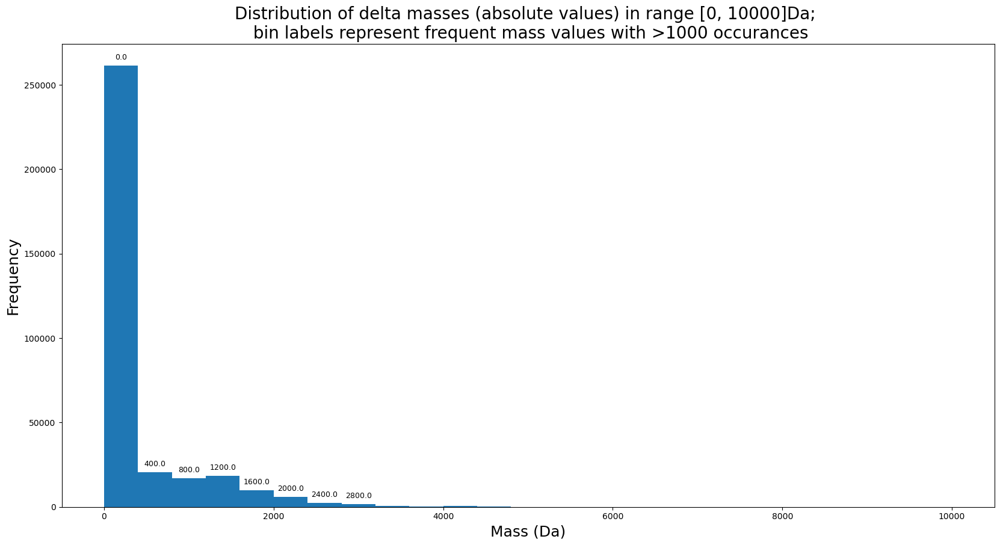

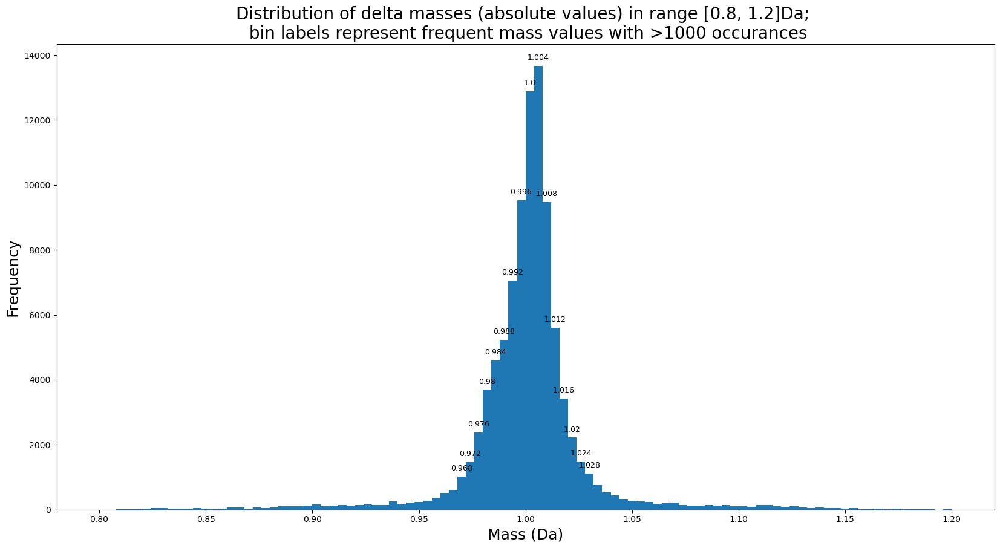

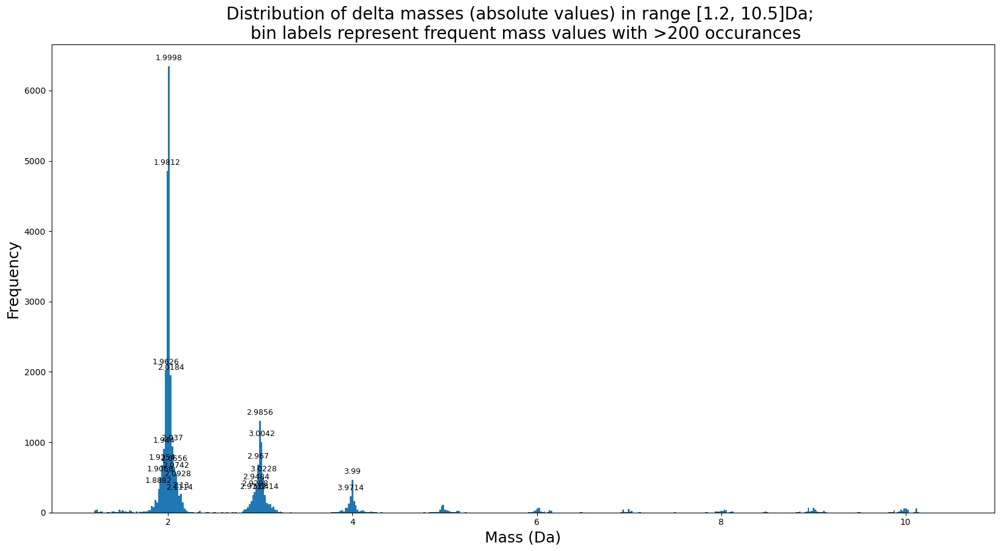

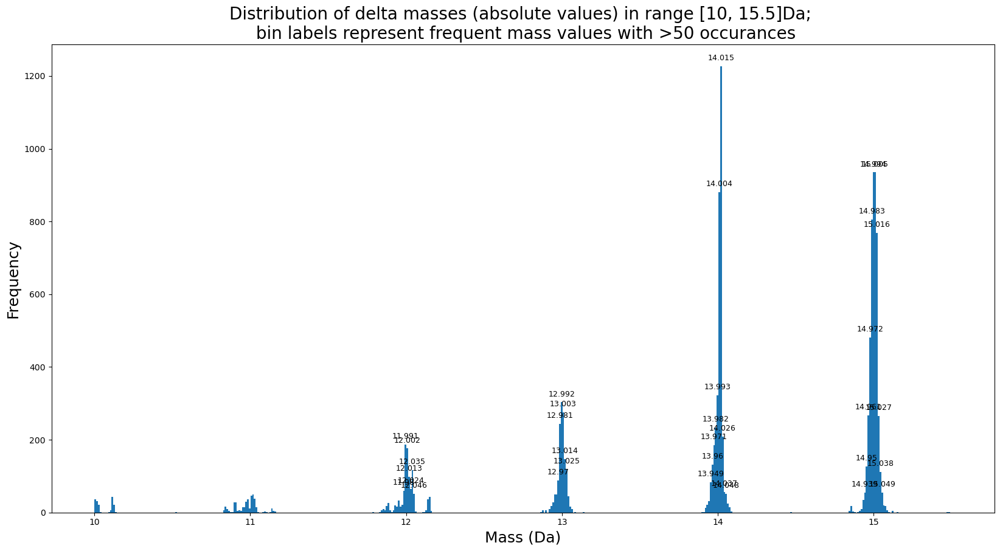

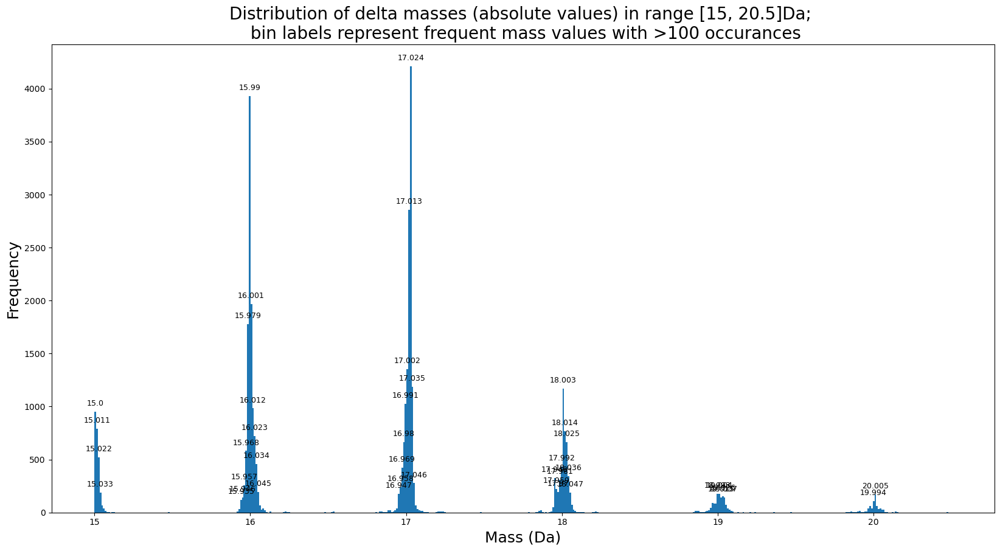

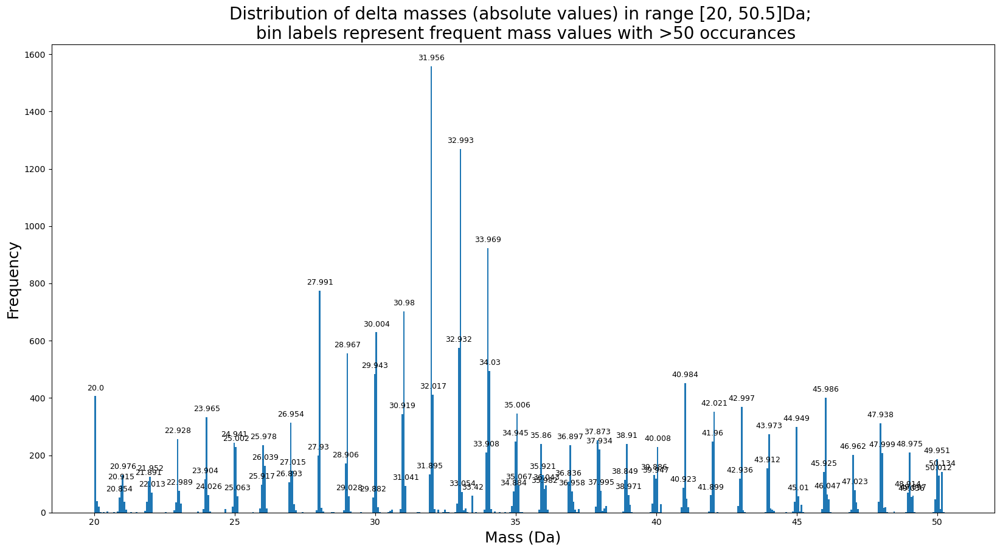

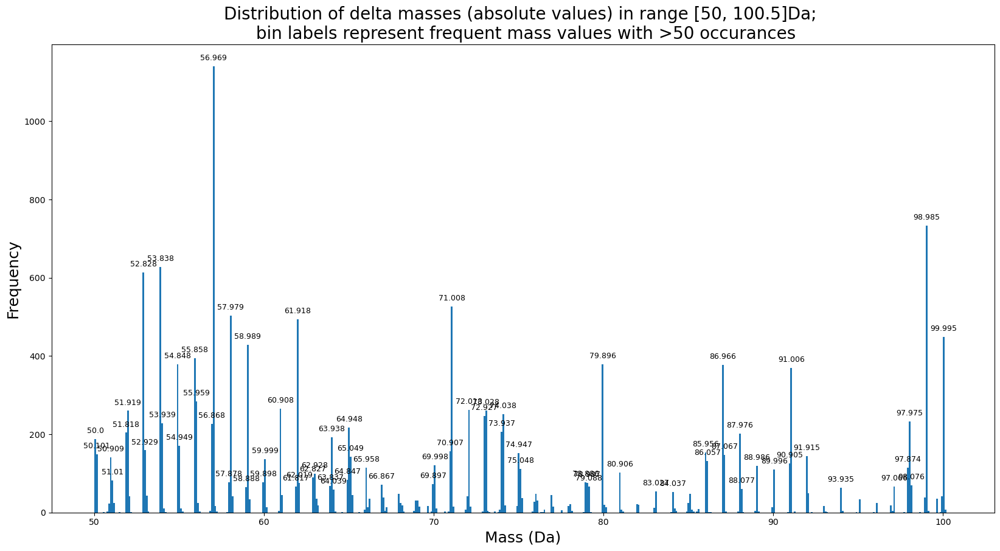

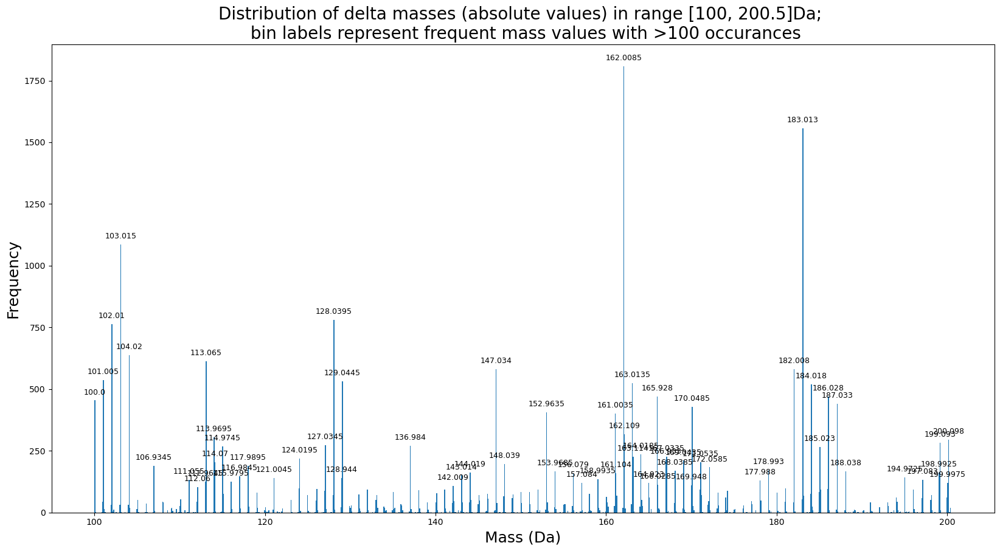

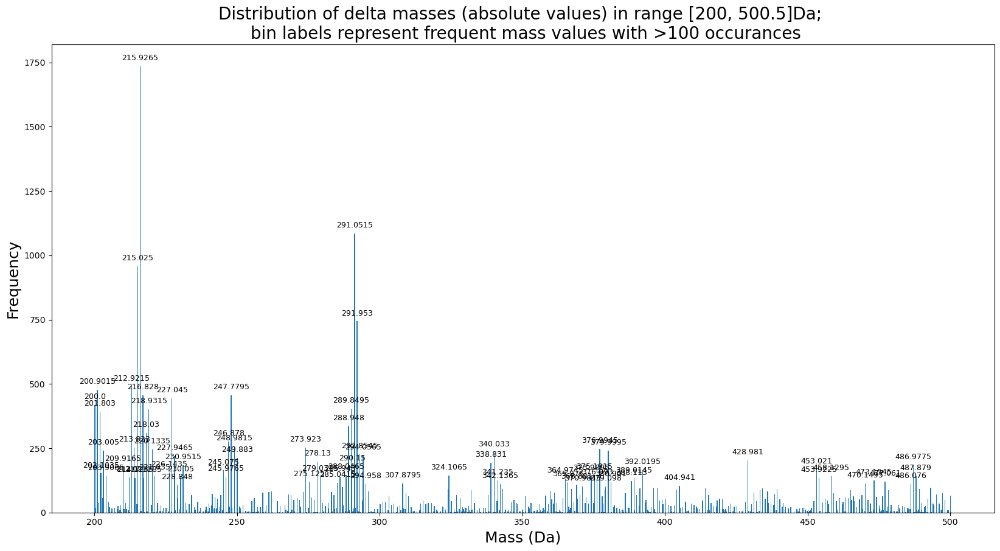

In [24]:
start = time.time()

#---all delta masses
p2e_nonInteractivePlot(all_delta_masses, 25, [0, 10000], 1000)

#---1 Da
p2e_nonInteractivePlot(all_delta_masses, 100, [0.8, 1.2], 1000)

#---1-10 Da
p2e_nonInteractivePlot(all_delta_masses, 500, [1.2, 10.5], 200)

#---10-15 Da
p2e_nonInteractivePlot(all_delta_masses, 500, [10, 15.5], 50)

#---15-20 Da
p2e_nonInteractivePlot(all_delta_masses, 500, [15, 20.5], 100)

#---20-50 Da
p2e_nonInteractivePlot(all_delta_masses, 500, [20, 50.5], 50)

#---50-100 Da
p2e_nonInteractivePlot(all_delta_masses, 500, [50, 100.5], 50)

#---100-200 Da
p2e_nonInteractivePlot(all_delta_masses, 1000, [100, 200.5], 100)

#---200-500 Da
p2e_nonInteractivePlot(all_delta_masses, 1000, [200, 500.5], 100)

end = time.time()
print(end-start)

<H1>Focused mass survey</H1>

In [25]:
start = time.time()

#------------
#------PART 3
#------------

#---Plot range of interest and return dataframe containing focused dataframe with clusters containing delta mass range of interest
focused_df1 = p3a_focusedDeltaMassPlotBokeh(df4, 50, [290.8, 291.3], 3, delta_mass_lower_limit)

display(focused_df1)

end = time.time()
print(end-start)

,cluster_number,consensus_precursor,consensus_mz_list,consensus_intensity_list,consensus_peak_count_list,cluster_member_count,matched_spectra_count,spectrum_list_scan_mz_charge_score,precursor_masses,delta_masses,Metamorpheus_peptides,healthy_dmasses,disease_dmasses,asymptomatic_dmasses
17974,17974,1493.663,"366.139,367.142,668.866,938.494,939.495,973.53...","280.92,37.45,17.25,12.88,6.98,31.07,16.08,23.4...","2,2,1,1,1,1,1,1,1,1,1,1,2,2,1,1,1,1,2,2,2,2,1,...",2,0,"['p-4#19878_1526.0071_3_108', 'h-6#18753_1428....","[4578.0213, 4286.9247]","[0.0, 291.097]","['*', '*']",[0],[0],[0]
18098,18098,1506.091,"318.177,366.139,367.142,368.145,428.252,441.23...","111.71,10106.26,1306.23,7.69,8.06,10.75,253.31...","13,32,32,1,1,1,10,1,32,1,3,32,2,13,20,32,32,1,...",32,0,"['n-5#30661_1457.0111_3_80', 'n-1#30918_1505.3...","[4371.0333, 4516.1073, 4662.147, 4369.0581, 43...","[0.0, 1.975, 1.978, 1.0, 0.984, 1.976, 1.988, ...","['*', '*', '*', '*', '*', '*', '*', '*', '*', ...","[292.104, 0.01, 0.011, 292.113, 0.997, 291.092...","[293.103, 292.113, 293.09, 2.013, 2.011, 292.1...","[145.074, 1.975, 291.094, 0.984, 290.108, 289...."
18140,18140,1511.535,"293.106,366.139,367.142,428.252,446.261,447.26...","2.88,8385.89,1146.64,9.32,233.43,9.91,1275.49,...","1,35,35,1,16,1,35,8,35,1,3,32,27,1,33,1,1,1,1,...",35,0,"['h-10#31255_1481.9945_3_84', 'n-3#30788_1603....","[4445.9835, 4811.1309, 4444.9656, 4737.1065, 4...","[0.0, 1.018, 0.986, 1.005, 1.036, 1.012, 1.015...","['*', '*', '*', '*', '*', '*', '*', '*', '*', ...","[290.087, 161.039, 163.046, 1.018, 163.046, 29...","[0.032, 0.023, 292.119, 1.025, 161.014, 160.01...","[74.024, 0.995, 366.137, 75.037, 365.169, 527...."
18651,18651,1583.574,"199.107,220.107,227.102,237.135,258.144,276.15...","16.10,124.78,140.87,1045.85,260.95,565.28,2248...","9,30,37,43,43,47,108,74,50,115,120,76,153,155,...",155,0,"['p-2#7966_1416.1172_3_89', 'h-8#7837_1489.838...","[4248.3516, 4469.5143, 3075.6834, 5936.206, 32...","[0.0, 1.011, 1.986, 1.027, 3.0, 1.014, 2.021, ...","['*', '*', '*', '*', '*', '*', '*', '*', '*', ...","[1393.831, 1172.663, 1611.987, 266.922, 1683.8...","[0.004, 1.003, 1466.734, 0.002, 220.165, 514.1...","[2640.362, 954.503, 2640.372, 516.176, 1469.69..."
18751,18751,1600.052,"366.138,367.141,420.244,464.246,528.191,533.32...","3934.52,501.35,168.39,7.21,198.37,166.61,13.94...","15,15,15,1,15,15,2,15,1,1,10,5,4,14,15,14,11,1...",15,0,"['n-3#31609_1628.7241_3_108', 'h-10#30318_1532...","[4886.1723, 4597.0872, 4887.1902, 4886.1702, 4...","[0.0, 1.047, 1.018, 0.994, 1.98, 1.001, 0.984,...","['*', '*', '*', '*', '*', '*', '*', '*', '*', ...","[289.083, 0.995, 290.079, 289.077, 290.078, 0....","[0.01, 290.092, 291.086, 290.102, 291.096, 0.994]","[1.018, 1.047, 291.065, 0.015, 290.069, 0.029,..."
19024,19024,1662.744,"274.092,275.096,292.103,293.105,366.139,367.14...","313.84,51.87,171.55,13.71,1042.69,204.78,31.48...","3,3,3,1,3,3,2,3,3,3,2,3,3,1,1,2,1,3,2,1,1,1,2,...",3,0,"['h-6#7724_1541.6195_2_97', 'h-6#8881_1687.168...","[3083.239, 3374.3372, 3373.3366]","[0.0, 1.001, 290.098, 291.098]","['*', '*', '*']","[291.098, 290.098, 1.001]",[0],[0]
19327,19327,1782.258,"274.092,292.103,366.139,367.142,522.314,528.19...","156.54,62.55,845.68,106.99,68.72,90.66,21.02,1...","2,2,3,3,3,3,2,1,2,3,3,3,1,1,3,3,3,1,1,3,3,2,3,...",3,0,"['h-6#15406_1806.7662_2_119', 'p-4#15146_1806....","[3613.5324, 3612.5302, 3321.4414]","[0.0, 1.002, 291.089, 292.091]","['*', '*', '*']",[292.091],[0],[0]
19343,19343,1793.690,"366.138,367.142,528.192,1013.594,1183.936,1184...","64.33,7.96,34.33,3.76,3.74,46.97,5.78,81.55,32...","1,1,3,1,1,4,1,4,3,3,1,4,4,4,4,4,4,4,4,4,4,4,4,...",4,0,"['n-4#29742_1803.4922_3_59', 'p-3#30024_1803.4...","[5410.4766, 5410.4805, 5409.4782, 5118.3849]","[0.0, 0.998, 1.002, 291.093, 292.092, 292.096,...","['*', '*', '*', '*']",[0],[0],"[0.998, 292.092, 291.093]"
44464,44464,478.624,"157.134,175.119,185.092,185.128,185.165,201.12...","4596.02,224.77,1425.51,1716.18,1704.17,411.35,...","42,10,30,39,43,11,

0.8005919456481934


<H1>Focused cluster survey</H1>

In [26]:
start = time.time()

cluster_pick1 = 44464

p3b_showCluster(focused_df1, cluster_pick1)
p3c_showAllDeltaMassesInCluster(focused_df1, cluster_pick1, delta_mass_lower_limit, 2000)

end = time.time()
print(end-start)

Sorted delta masses
[0.0, 0.0, 0.001, 0.001, 0.001, 0.001, 0.002, 0.002, 0.002, 0.002, 0.003, 0.003, 0.003, 0.004, 0.004, 0.004, 0.004, 0.005, 0.005, 0.006, 0.006, 0.006, 0.007, 0.007, 0.007, 0.007, 0.008, 0.008, 0.977, 0.977, 0.978, 0.978, 0.979, 0.981, 0.982, 0.982, 0.982, 0.983, 0.983, 0.983, 0.984, 0.984, 0.984, 0.985, 0.985, 0.985, 0.986, 0.986, 0.986, 0.986, 17.023, 17.024, 17.024, 17.024, 17.025, 17.025, 17.025, 17.026, 17.026, 17.026, 17.026, 17.027, 17.027, 17.027, 17.028, 17.028, 17.028, 17.029, 17.029, 17.029, 17.029, 17.03, 17.03, 17.031, 17.032, 17.032, 17.032, 17.033, 17.033, 17.033, 17.034, 17.034, 17.034, 17.035, 17.035, 18.009, 18.009, 18.01, 18.01, 18.01, 18.011, 18.011, 18.011, 18.011, 18.012, 18.012, 18.012, 18.013, 18.013, 212.079, 212.08, 212.08, 212.08, 212.081, 212.081, 212.081, 212.081, 212.082, 212.082, 212.082, 212.083, 212.083, 212.083, 212.083, 212.084, 212.084, 212.085, 229.106, 229.106, 229.107, 229.107, 229.107, 229.108, 229.108, 229.108, 229.108, 229.10

0.28365278244018555
